# Analysis of Satellite Images in the Visible Channel

Satellite images in the visible channel (~0.6 µm) provide a detailed representation of the Earth's surface and cloud formations during the day, allowing the identification of meteorological and geographic patterns. To ensure consistency in the analysis, the reflectance of the images was normalized, ranging from 0 to 1, where 0 represents total absorption of light and 1 indicates complete reflection.

The water vapor channel images captured by the GOES satellite cover the Americas and show the distribution of water vapor in the middle troposphere. This type of image is useful for analyzing atmospheric dynamics, identifying circulation patterns, and monitoring large-scale weather systems. However, due to the nature of the measurement, detecting the Earth’s surface is more difficult compared to the visible channel.

Although File 1 and File 2 represent different bands than File 3 (visible and water vapor), they can still be merged to provide a more comprehensive analysis. The merging of these images maintains the continuity of atmospheric structures, especially in relation to cloud formations.

# Interpretation of Regions in the Images

## 1. Clouds and Meteorological Systems

Brighter regions in the image indicate high clouds, such as cumulonimbus, associated with intense convective systems. In the tropics, these clouds are common in severe thunderstorms and can reach high altitudes, reaching up to the tropopause (~15-18 km). In the extratropics, extratropical cyclones present vortex-like patterns, with well-defined cold and warm fronts. Clouds in these systems are generally lower than those in the tropics, which explains the lower brightness values ​​observed in these regions. In the image, it is possible to detect the Intertropical Convergence Zone (ITCZ) positioned more towards the Southern Hemisphere, evidenced by the high cloudiness observed in the strip between southern Africa and regions to the east of the Pacific Ocean. In this same strip, a discontinuity in the cloudiness band can be seen in the Atlantic Ocean region, probably due to the South Atlantic Subtropical High. In addition, in the Amazon region, a cloudiness zone can also be seen that extends across the continent, mainly in southeastern Brazil.

In the water vapor channel, the distribution of moisture in the middle troposphere can be observed. Regions with a higher water vapor content appear brighter, while dry areas are darker. This channel is essential for monitoring moisture transport patterns and the evolution of large-scale weather systems. In this channel, the presence of moisture vortices in the middle troposphere is evident in the south of South America, both east and west of the Andes Mountains.

## 2. Earth's Surface

Deserts, such as the Sahara, appear extremely bright due to the high reflectivity of the sand. Forests and dense vegetation, especially in southern Africa and Australia, appear darker in the visible channel, as they absorb more solar radiation.

In the water vapor channel, the Earth's surface is rarely visible because the image mainly represents the moisture present in the atmosphere and not the reflectance of the surface.

In [6]:
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import rasterio
import numpy as np

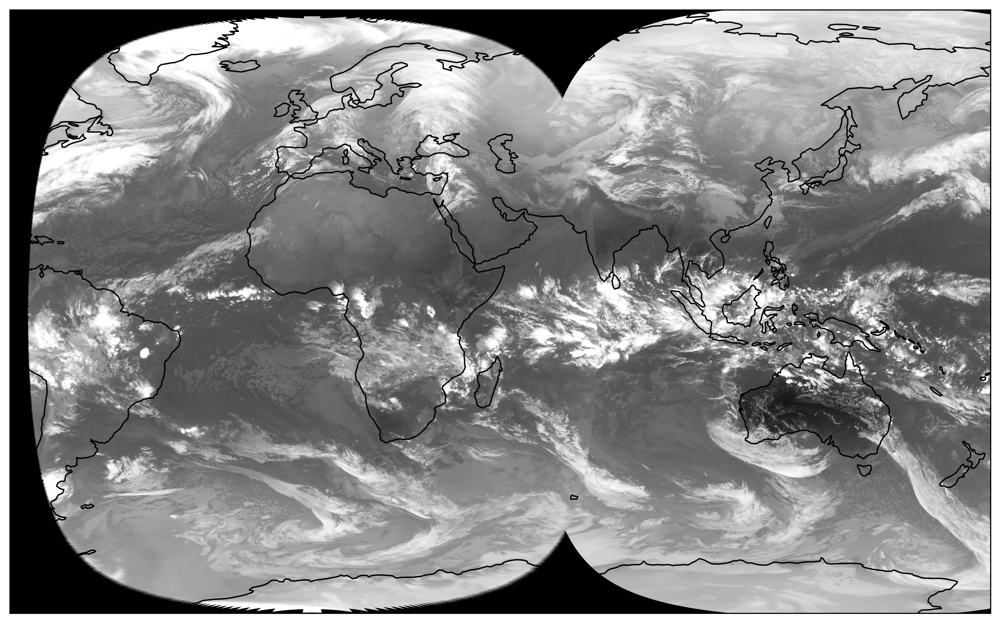

In [9]:
dataset = xr.open_dataset('/home/marten/dataops/dataops-challenge-satellite/satellite-data-processing/processed_data/tiffs/merged_1_2.epsg:4326.tiff')
dataset = dataset.sel(x=slice(-80,None))
lons, lats = dataset.x.values, dataset.y.values
band = dataset['band_data'].values
p2, p98 = np.percentile(band, (2, 98))
band_stretched = np.clip(band, p2, p98)

band_norm = (band_stretched - p2) / (p98 - p2)
fig = plt.figure(figsize=(16,8), dpi=300)
ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ax.imshow(band_norm[0], cmap="gray", extent=[lons[0], lons[-1], lats[-1], lats[0]])
plt.show()

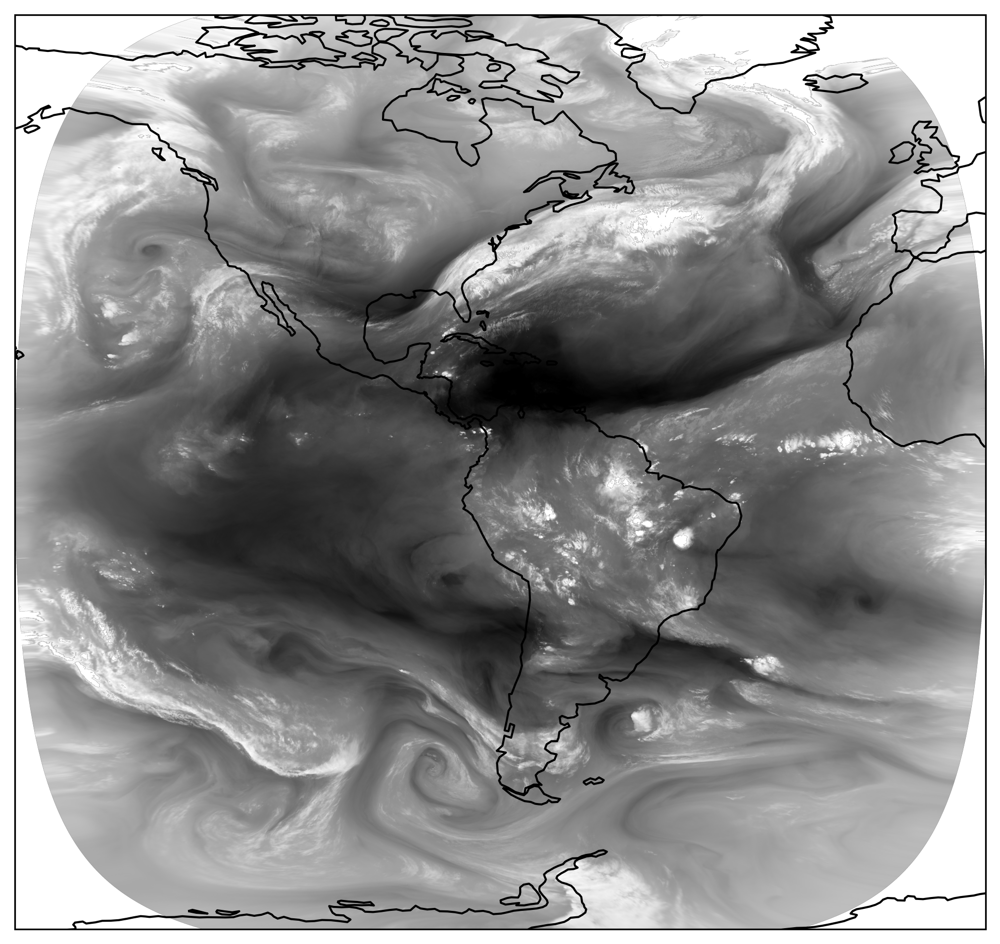

In [12]:
dataset = xr.open_dataset('/home/marten/dataops/dataops-challenge-satellite/satellite-data-processing/processed_data/tiffs/file3.epsg:4326.tiff')
lons, lats = dataset.x.values, dataset.y.values
band = dataset['band_data'].values

fig = plt.figure(figsize=(16,8), dpi=300)
ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ax.imshow(band[0], cmap="gray", transform=ccrs.PlateCarree(), extent=[lons[0], lons[-1], lats[-1], lats[0]])
#plt.colorbar(label='Vapor Water (K)')
plt.show()

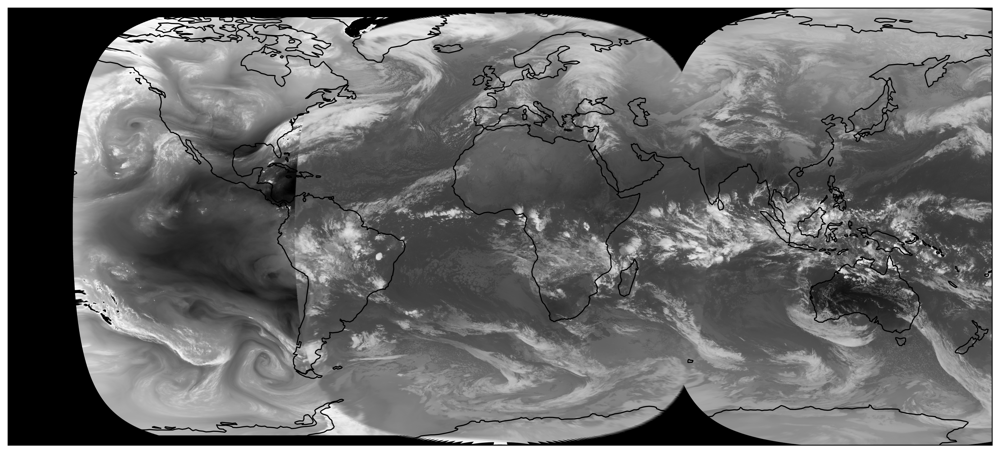

In [13]:
dataset = xr.open_dataset('/home/marten/dataops/dataops-challenge-satellite/satellite-data-processing/processed_data/tiffs/merged.epsg:4326.tiff')
lons, lats = dataset.x.values, dataset.y.values
band = dataset['band_data'].values

fig = plt.figure(figsize=(16,8), dpi=300)
ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ax.imshow(band[0], cmap="gray", transform=ccrs.PlateCarree(), extent=[lons[0], lons[-1], lats[-1], lats[0]])
#plt.colorbar(label='Vapor Water (K)')
plt.show()